The Copernicus digital elevation model is derived from the WorldDEMTM digital surface model based on the radar satellite data acquired during the TanDEM-X Mission. The Planetary Computer hosts these data as Cloud Optimized GeoTIFFs in two resolutions, 90m and 30m.

For this example, we will find the DEM tile that includes the Grand Canyon and plot the elevation data with some hillshade.

In [44]:
#!pip install xarray-spatial 0.3.5
#!pip install xarray  2023.1.0
#!pip install datashader  0.14.3
#!pip install rasterio1.3.4
#!pip install folium 0.14.0
#!pip show folium 0.14.0

In [45]:
import numpy as np
import pandas as pd
from pathlib import Path
import odc.stac
import geopandas as gpd
import geopy.distance as distance
from shapely.geometry import Point
import rioxarray 
import xarray
import rasterio
import matplotlib.pyplot as plt
from rasterio import plot
import geopandas as gpd
from shapely.geometry import box
import datashader
import folium
from IPython.display import display

%matplotlib inline


 find the DEM tile that includes the Grand Canyon and plot the elevation data with some hillshade.

In [46]:
#find the DEM tile that includes the Grand Canyon and plot the elevation data with some hillshade.
import pystac_client
import planetary_computer

catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

Perform a STAC API query against the finer resolution cop-dem-glo-30 collection for our point of interest.

In [47]:
grand_canyon = [-112.15, 36.05]
search = catalog.search(
    collections=["cop-dem-glo-30"],
    intersects={"type": "Point", "coordinates": grand_canyon},
)
items = list(search.get_items())
print(f"Returned {len(items)} items")

Returned 1 items


A single item was returned which includes the elevation data and additional assets for quick visualization.

In [48]:
list(items[0].assets)

['data', 'tilejson', 'rendered_preview']

In [49]:
items[0]


ID: Copernicus_DSM_COG_10_N36_00_W113_00_DEM
"Bounding Box: [-113.00013888888888, 36.00013888888889, -112.00013888888888, 37.00013888888889]"
Datetime: 2021-04-22 00:00:00+00:00
gsd: 30
datetime: 2021-04-22T00:00:00Z
platform: TanDEM-X
proj:epsg: 4326
"proj:shape: [3600, 3600]"
"proj:transform: [0.0002777777777777778, 0.0, -113.00013888888888, 0.0, -0.0002777777777777778, 37.00013888888889]"
stac_extensions: ['https://stac-extensions.github.io/projection/v1.0.0/schema.json']
https://stac-extensions.github.io/projection/v1.0.0/schema.json


In [50]:
# get details of all of the items returned
item_details = pd.DataFrame(
    [
        {
            "datetime": item.datetime.strftime("%Y-%m-%d"),
            "platform": item.properties["platform"],
            "min_long": item.bbox[0],
            "max_long": item.bbox[2],
            "min_lat": item.bbox[1],
            "max_lat": item.bbox[3],
            "bbox": item.bbox,
            "item_obj": item,
        }
        for item in items
    ]
)

print(f"Filtering from {len(item_details)} returned to {item_details.sum()} items that contain the sample location")
item_details[["datetime", "platform", "bbox"]].sort_values(by="datetime")


Filtering from 1 returned to datetime                                           2021-04-22
platform                                             TanDEM-X
min_long                                          -113.000139
max_long                                          -112.000139
min_lat                                             36.000139
max_lat                                             37.000139
bbox        [-113.00013888888888, 36.00013888888889, -112....
item_obj    <Item id=Copernicus_DSM_COG_10_N36_00_W113_00_...
dtype: object items that contain the sample location


,datetime,platform,bbox
0,2021-04-22,TanDEM-X,"[-113.00013888888888, 36.00013888888889, -112...."


In [51]:
bbox2=item_details["bbox"].tolist()
bbox2
bbox=bbox2[0]
bbox

[-113.00013888888888,
 36.00013888888889,
 -112.00013888888888,
 37.00013888888889]

In [52]:
# load the tile into an xarray after signing the HREF using planetary_computer.sign. Here we are downsampling the data to reduce the image size for this notebook.

import planetary_computer
import rioxarray

signed_asset = planetary_computer.sign(items[0].assets["data"])
data = (
    rioxarray.open_rasterio(signed_asset.href)
    .squeeze()
    .drop("band")
    .coarsen({"y": 5, "x": 5})
    .mean()
)

With the data loaded, we can use xarray-spatial to generate a shaded relief.

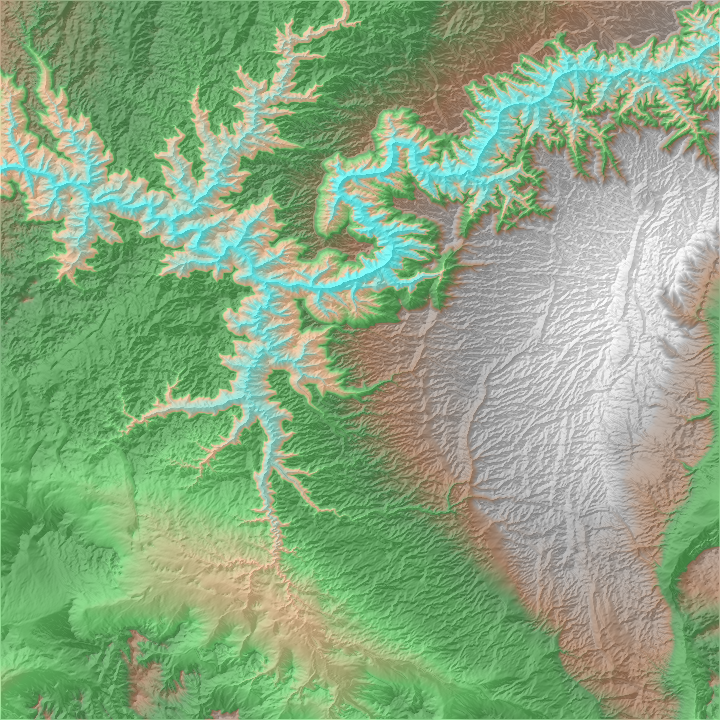

In [53]:
import xrspatial
from datashader.transfer_functions import shade, stack
from datashader.colors import Elevation

hillshade = xrspatial.hillshade(data)
stack(shade(hillshade, cmap=["white", "gray"]), shade(data, cmap=Elevation, alpha=128))

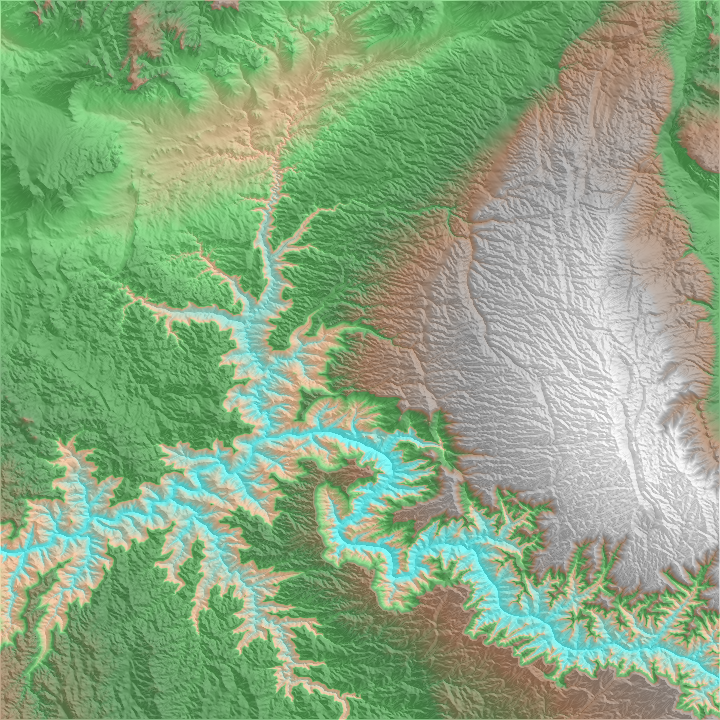

In [54]:
hillshade = xrspatial.hillshade(data)
stack(shade(hillshade, cmap=["white", "gray"]), shade(data[::-1, :], cmap=Elevation, alpha=128))

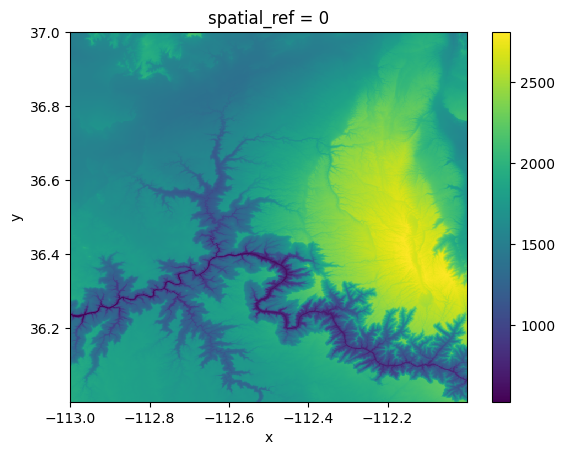

In [55]:
data.plot()

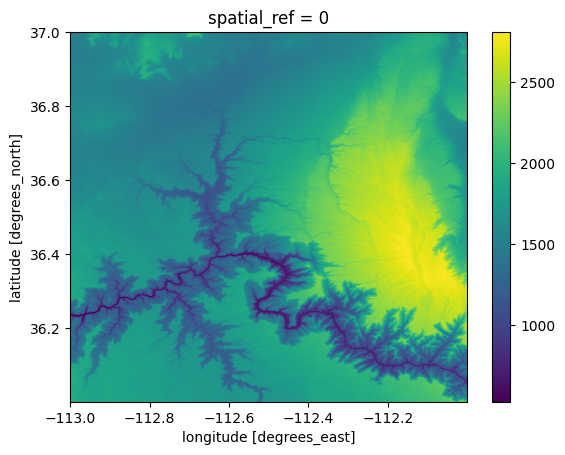

In [56]:
# clip using bounds in a CRS different from the dataset if you pass in the crs kwarg 
xdsc = data.rio.clip_box(
    minx=bbox[0],
    miny=bbox[1],
    maxx=bbox[2],
    maxy=bbox[3],
    crs="EPSG:4326"
)
xdsc.plot()

In [85]:
#To plot the location on a map using Seaborn
import folium
import seaborn as sns
from IPython.display import display

def plot_location_on_map(latitude, longitude):
    m = folium.Map(location=[latitude, longitude], zoom_start=12)
    folium.Marker([latitude, longitude]).add_to(m)
    display(m)

plot_location_on_map(36.05, -112.15)

In [86]:
plot_location_on_map(36.05, -112.15)

In [59]:
# get path to the data folder
DATA_DIR = Path.cwd().parent.resolve() / "data"
assert DATA_DIR.exists()

In [60]:
# get path to the data folder
DATA_DIR = Path.cwd().parent.resolve() / "data"
assert DATA_DIR.exists()

In [61]:
# read .csv files
train_labels = pd.read_csv(DATA_DIR / "train_labels.csv")
submission_format = pd.read_csv(DATA_DIR / "submission_format.csv", index_col=0)
metadata = pd.read_csv(DATA_DIR / "metadata.csv")

In [62]:
dataset = metadata.merge(train_labels, on='uid', how='inner')
dataset.sort_values('density', ascending=False).head(10)

,uid,latitude,longitude,date,split,region,severity,density
7843,lvtt,39.210670,-96.972980,2015-10-05,train,midwest,5,8.046675e+08
13853,vbvq,38.388890,-97.093060,2013-06-10,train,midwest,5,1.959300e+08
16198,yqgb,39.211550,-97.005590,2014-09-22,train,midwest,5,9.127360e+07
12797,tlfq,39.210670,-96.972980,2015-07-13,train,midwest,5,7.660800e+07
4287,gnlr,43.329370,-108.156190,2021-08-17,train,west,5,7.181390e+07
8235,mmwy,39.210670,-96.972980,2015-10-26,train,midwest,5,6.016500e+07
3486,fhyp,39.407630,-99.446670,2018-06-18,train,midwest,5,5.969250e+07
3036,epww,39.399200,-99.424810,2018-08-13,train,midwest,5,5.953500e+07
9506,omai,42.217010,-109.370990,2021-08-31,train,west,5,4.356760e+07
8360,mrrk,44.359408,-104.833233,2019-09-09,train,west,5,4.260262e+07


In [63]:

import geopy.distance as distance
# get our bounding box to search latitude and longitude coordinates
def get_bounding_box_by_uid(df, uid, meter_buffer=50000):
    """
    Given a DataFrame with columns 'uid', 'latitude', 'longitude' and a uid, returns a bounding
    box around the point with the buffer on the left, right, top, and bottom.
    """
    record = df[df['uid'] == uid]
    latitude = record['latitude'].values[0]
    longitude = record['longitude'].values[0]
    distance_search = distance.distance(meters=meter_buffer)
    # calculate the lat/long bounds based on ground distance
    # bearings are cardinal directions to move (south, west, north, and east)

    min_lat = distance_search.destination((latitude, longitude), bearing=180)[0]
    min_long = distance_search.destination((latitude, longitude), bearing=270)[1]
    max_lat = distance_search.destination((latitude, longitude), bearing=0)[0]
    max_long = distance_search.destination((latitude, longitude), bearing=90)[1]

    return [min_long, min_lat, max_long, max_lat]

In [64]:
df=metadata
uid='dign'

In [65]:
bbox = get_bounding_box_by_uid(df, uid, 1000000)
bbox

[-87.79180500760813, 31.39343090363405, -64.36819499239186, 49.40433433494962]

In [66]:
def get_coordinates(df, uid):
    record = df[df['uid'] == uid]
    latitude = record['latitude'].values[0]
    longitude = record['longitude'].values[0]
    return [longitude, latitude]

In [67]:

coordinates=get_coordinates(metadata, uid)
coordinates

[-76.08, 40.40586]

In [68]:

search = catalog.search(
    collections=["cop-dem-glo-30"],
    intersects={"type": "Point", "coordinates": coordinates},
)
items = list(search.get_items())
print(f"Returned {len(items)} items")

Returned 1 items


In [69]:
# Get the first item
item = items[0]
item

ID: Copernicus_DSM_COG_10_N40_00_W077_00_DEM
"Bounding Box: [-77.00013888888888, 40.00013888888889, -76.00013888888888, 41.00013888888889]"
Datetime: 2021-04-22 00:00:00+00:00
gsd: 30
datetime: 2021-04-22T00:00:00Z
platform: TanDEM-X
proj:epsg: 4326
"proj:shape: [3600, 3600]"
"proj:transform: [0.0002777777777777778, 0.0, -77.00013888888888, 0.0, -0.0002777777777777778, 41.00013888888889]"
stac_extensions: ['https://stac-extensions.github.io/projection/v1.0.0/schema.json']
https://stac-extensions.github.io/projection/v1.0.0/schema.json


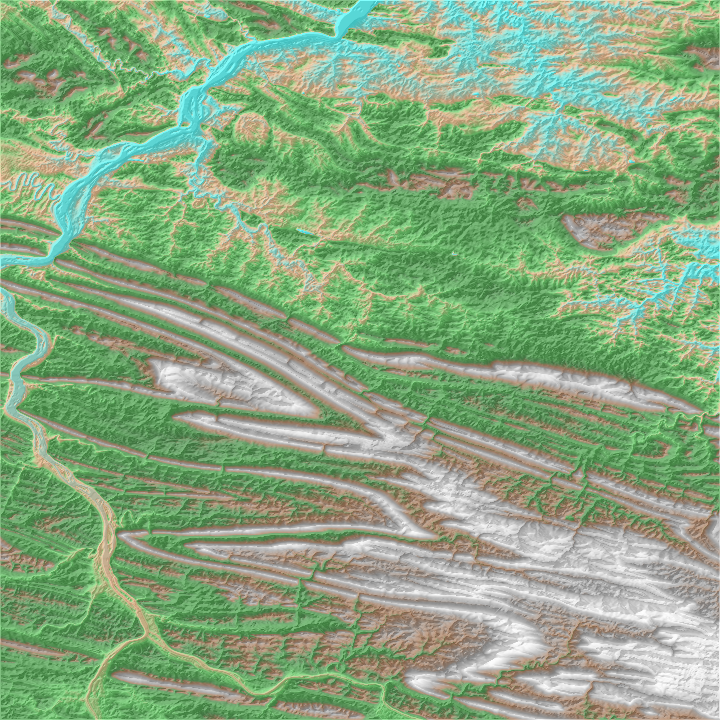

In [70]:
signed_asset = planetary_computer.sign(items[0].assets["data"])
data = (
    rioxarray.open_rasterio(signed_asset.href)
    .squeeze()
    .drop("band")
    .coarsen({"y": 5, "x": 5})
    .mean()
)


hillshade = xrspatial.hillshade(data)
stack(shade(hillshade, cmap=["white", "gray"]), shade(data, cmap=Elevation, alpha=128))

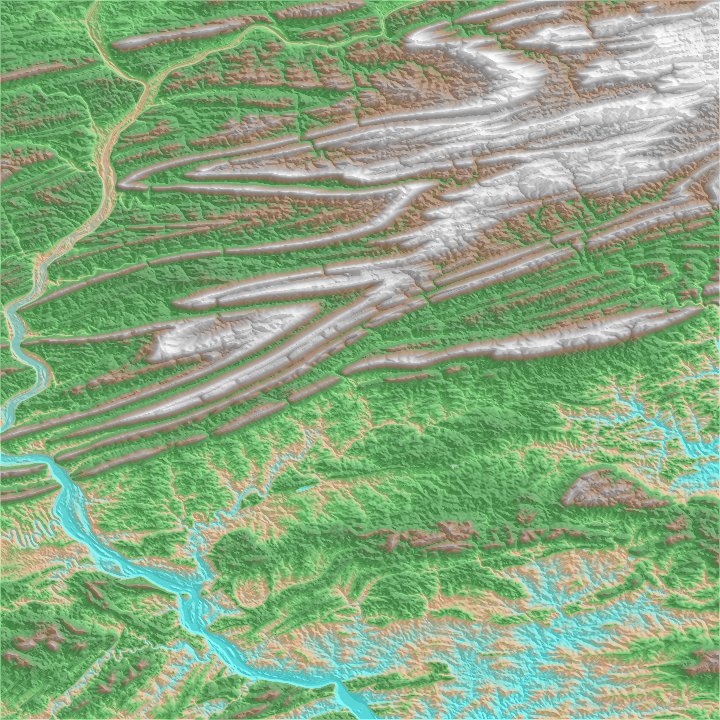

In [71]:
hillshade = xrspatial.hillshade(data)
stack(shade(hillshade, cmap=["white", "gray"]), shade(data[::-1, :], cmap=Elevation, alpha=128))

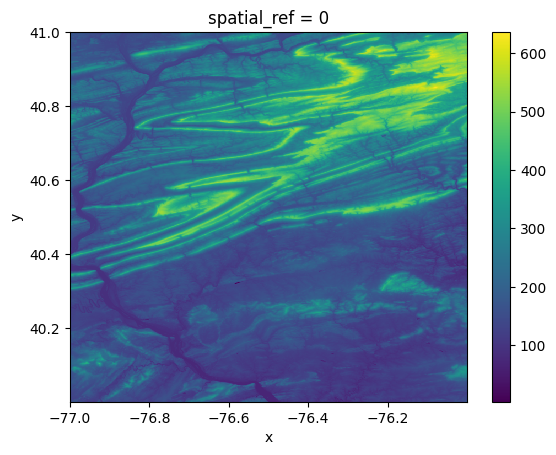

In [72]:

data.plot()

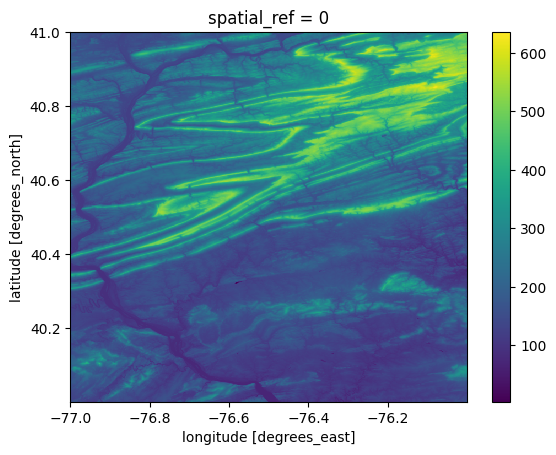

In [73]:
xdsc = data.rio.clip_box(
    minx=bbox[0],
    miny=bbox[1],
    maxx=bbox[2],
    maxy=bbox[3],
    crs="EPSG:4326"
)
xdsc.plot()

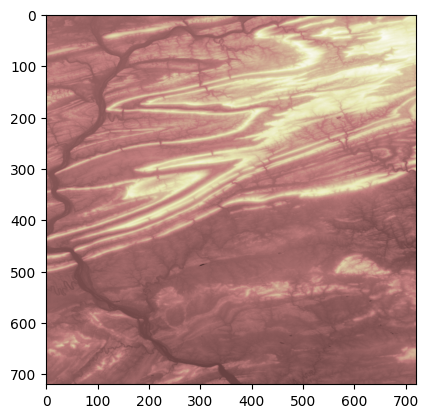

In [74]:
plt.imshow(data, cmap='pink')

plt.show()

In [75]:
#==========================================================================================================================

In [88]:
# get the latitide and longitude 
def get_latitude_longitude(df,uid):
  location= df[df['uid'] == uid]
  latitude = location['latitude'].values[0]
  longitude = location['longitude'].values[0]
  print(f"latitude: ({latitude}, logitude: {longitude}) ")
#get the latitude and longitude
get_latitude_longitude(metadata,uid)

latitude: (40.40586, logitude: -76.08) 


In [89]:
#function that takes the latitude and longitude coordinates of a location and opens it in Google Maps in a web browser:
import webbrowser
def show_location_google_map(latitude,longitude):
    url = "https://maps.google.com/?q=" + str(latitude) + "," + str(longitude)
    webbrowser.open(url)

#show_location_google_map 
show_location_google_map(40.40586,-76.88)

In [82]:
#plot location on map
plot_location_on_map(40.40586, -76.88)
    